# Сравнительный анализ стратегий алгоритмической торговли на фондовом рынке на основе индикаторов технического анализа и предиктивных моделей

## Индикаторы технического анализа

В данном ноутбуке будет рассмотрен общий алгоритм торговли и стратегии основанные на индикаторах технического анализа.

In [1]:
import sys
sys.path.append("../")
sys.path.append("C:/Projects/TradingAlgorithm")

Торговля будет проводиться по акциям американских компаний из S&P500, так как акции этих компаний наиболее популярны среди институциональных инвесторов и в меньшей степени подвержены вне рыночным факторам и рискам. Беруться компании с высокими объёмами дневной торговли, так как мы исходим из предпосылки, что наши действия не оказывают влияния на цену. Рассматриваются компании из различных секторов экономики для хеджирования секторальных рисков. 

In [2]:
# tracked_corps = ["WMT", "AAPL", "MSFT", "JPM", "KO", "PG", "XOM"]
tracked_corps = ["WMT", "AAPL", "JPM"]

Торговый алгоритм работает в режиме swing торговли (длительность одной торговой позиции - несколько дней / недель). Все значения по умолчанию рассматриваются как дневные значения. Предполагается, что все позиции открываются в конце торговой сессии, значение цены акции на момент открытия позиции счиатется равным значению цены на момент закрытия сессии.

Данные биржевой торговли рассматриваются в периоде с 1 января 2000 года по 31 декабря 2021

In [3]:
start_date, end_date = "2000-01-01", "2021-12-31"

В качестве источника данных по биржевым дневным сессиям торговли был выбран сервис yahoo finance

In [4]:
import yfinance as yf
import pandas as pd

In [5]:
stock_data = {}

for corp in tracked_corps:
    stock_data[corp] = yf.download(corp, start=start_date, end=end_date)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [6]:
stock_data["WMT"][:5]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1999-12-31,68.3125,70.2500,68.2500,69.1250,46.123295,2112700
2000-01-03,68.3750,69.0000,65.5000,66.8125,44.580303,8369900
2000-01-04,65.5000,65.8125,64.1875,64.3125,42.912182,6745100
2000-01-05,63.8750,64.3750,62.1875,63.0000,42.036438,7018700
2000-01-06,63.0000,64.5625,62.6875,63.6875,42.495159,6544500


Основным инструментом технического анализа являются различные технические индикаторы. В качестве индикаторов для реализации и рассмотрения были выбраны следующие: RSI, MACD, CCI, Полосы Боллинджера, SuperTrend и Поддержка/Сопротивление от скользящих средних, так как это одни из наиболее популярных и хорошо известных индикаторов, на которые ориентируется большое число участников рынка. 

In [6]:
from indicators.abstract_indicator import TradeAction
from indicators.rsi import RSI
from indicators.macd import MACD, MACDTradeStrategy
from indicators.super_trend import SuperTrend
from indicators.cci import CCI
from indicators.bollinger_bands import BollingerBands
from indicators.ma_support_levels import MASupportLevels

Но перед тем как перейти к подробному рассмотрению каждого из индикаторов, рассмотрим общие интерфейс и принципы работы, которые реализует каждый индикатор, на примере индикатора RSI.    

In [8]:
indicator = RSI()

У каждого индикатора есть главный метод calculate(data) который принимает рыночные данные по акции (data) и на их основе расчитывает значение индикатора для каждого дня из датасета (data) (некоторые индикаторы расчитываются по интервалу в несколько дней и могут не иметь значения для дней в начале датасета)

In [9]:
indicator.calculate(data=stock_data["WMT"][:1000])

In [10]:
indicator.RSI_val[-5:]

Date
2003-12-17    34.726372
2003-12-18    40.485665
2003-12-19    39.156841
2003-12-22    44.778358
2003-12-23    42.995817
dtype: float64

Помимо расчёта самого значения индикатора для каждого индикатора определен определённый набор правил, по которым исходя из значений индикатора даётся соответствующая торговая рекомендация на текущий момент.

Все виды торговых действий, которые может рекомендовать индикатор перечислены в множестве TradeAction: NONE - ничего не делать, BUY/SELL - покупать/продавать, ACTIVELY_BUY/SELL - активно покупать/покупать. Различие между простым действием (BUY/SELL) и активным (ACTIVELY_BUY/SELL) в уровне уверенности индикатора в том, что цена будет двигаться в ожидаемом направлении.

In [11]:
TradeAction.get_elements_list()

[<TradeAction.NONE: 0>,
 <TradeAction.BUY: 1>,
 <TradeAction.ACTIVELY_BUY: 2>,
 <TradeAction.SELL: 3>,
 <TradeAction.ACTIVELY_SELL: 4>]

Для расчёта рекомендаций для переданных данных используется метод find_trade_points()

In [12]:
trade_points = indicator.find_trade_points()
trade_points[-5:]

,PRICE,ACTION
DATE,,
2003-12-17,51.900002,NONE
2003-12-18,52.599998,NONE
2003-12-19,52.349998,NONE
2003-12-22,53.070000,NONE
2003-12-23,52.770000,NONE


Чтобы посмотреть все дни когда индикатор рекомендовал открыть торговую позицию используется метод select_action_trade_points(start_date, end_date). Значения start_date и end_date специфицируют временной период.

In [13]:
indicator.select_action_trade_points()

,PRICE,ACTION
DATE,,
2000-02-24,47.875000,BUY
2000-02-28,46.187500,BUY
2003-12-16,51.389999,BUY


Для более удобного восприятия торговых рекомендаций и связи значений индикатора и цены акции рекомендуется визуализировать индикатор с
помощью метода plot(start_date, end_date).

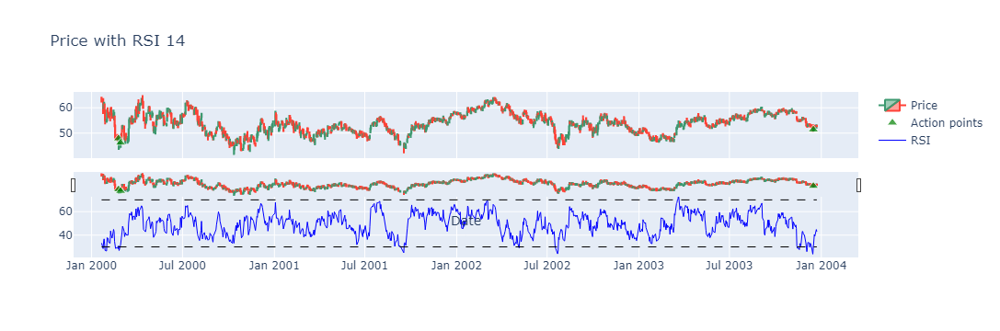

In [14]:
indicator.plot()

При поступлении данных по новому дню можно расчитать торговую рекомендацию для этого дня с помощью метода evaluate_new_point(new_point, date), где date - дата нового дня торгов, new_point - торговые данные по этому дню. Значение индикатора и торговая рекомендация для нового дня будут также сохранены внутри индикатора.

In [15]:
indicator.evaluate_new_point(stock_data["WMT"].iloc[1000], stock_data["WMT"].index[1000])

<TradeAction.NONE: 0>

In [16]:
indicator.RSI_val[-5:]

2003-12-18    40.485665
2003-12-19    39.156841
2003-12-22    44.778358
2003-12-23    42.995817
2003-12-24    41.059544
dtype: float64

Каждый индикатор специфицируется определённым набором параметров. Каждый из этих параметров можно поменять или вернуть к значению по умолчанию. После чего произвести перерасчёт индикатора по уже заданному датасету или по новому.

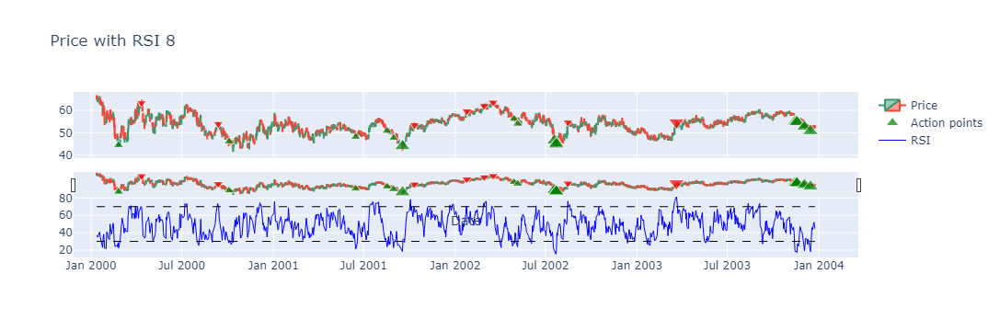

In [17]:
indicator.set_N(8)
indicator.calculate()
indicator.find_trade_points()
indicator.plot()

Формулы расчёта индикаторов в данном отчете приводиться не будут, но будут приведены источники описывающие индикаторы.В правильности работы каждого из  приведнных индикаторов можно убедиться с работой индикаторов на сайте https://tradingview.com/ . Значения параметров по умолчанию для индикаторов также брались с данного ресурса.

### RSI

https://ru.wikipedia.org/wiki/%D0%98%D0%BD%D0%B4%D0%B5%D0%BA%D1%81_%D0%BE%D1%82%D0%BD%D0%BE%D1%81%D0%B8%D1%82%D0%B5%D0%BB%D1%8C%D0%BD%D0%BE%D0%B9_%D1%81%D0%B8%D0%BB%D1%8B

#### Описание алгоритма выбора рекомендации

Стандартно, уровнями перекупленности/перепроданности считаются значения 70/30. Давая рекомендацию сразу при достижении индикатором порогового значения, сталкиваемся с проблемой, что зайдя в зону перекупленности/перепроданности индикатор ещё достаточно длительное время может находиться в зоне, то есть цена продолжает движение в противоположном от ожидаемого направлении. Это будет приводить к срабатыванию стоп лоссов и убыткам. Возможны и просто "выбросы" когда индикатор лишь касается границы и возвращается в зону "нормальности" на следующий день. Подобные "выбросы" также приводят к ложным рекомендациям и убыткам.

Для повышения надежности рекомендаций в алгоритме действует набор правил. Описание будет приведено для случая перепроданности, для случая перекупленности все правила работают зеркально.

1. Если значение RSI < 20 -> ACTIVELY_BUY (сильная перепроданность)
2. Если значение RSI <= 30 : 
    * Если RSI до этого не находился в зоне перепроданности, то запоминаем данное значение и ждем значение индикатора на следующий день -> NONE
    * Если RSI до этого уже находился в зоне перепроданности:
        - Если разница между текущим значением RSI и прошлым >= 5 -> BUY (сильное изменение индикатора говорит, что цена либо уже развернулась, либо развернётся в ближайшее время)
        - Если текущее значение > предыдущего и > значения 30.5 -> BUY (цена ещё находиться в зоне перепроданности, но динамика индикатора говорит о развороте)
3. Если 30 < RSI <= 32.5 и прошлое значение RSI находилось в зоне перепроданности -> BUY (цена уже развернулась, но ещё не израсходовала всего восстановительного потенциала)

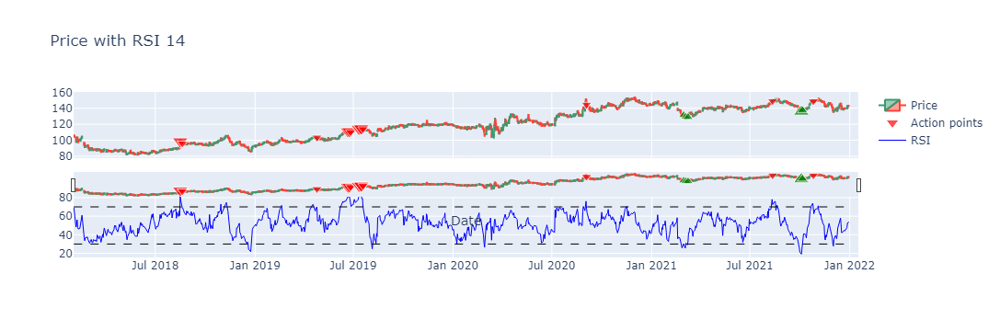

In [18]:
rsi = RSI()
rsi.calculate(stock_data["WMT"][-1000:])
rsi.find_trade_points()
rsi.plot()

### MACD

https://ru.wikipedia.org/wiki/%D0%98%D0%BD%D0%B4%D0%B8%D0%BA%D0%B0%D1%82%D0%BE%D1%80_MACD

#### Описание алгоритма выбора рекомендации

Классическая стратегия: 
* Если линия MACD пересекает сигнальную линию сверху:
    - MACD > 0 -> ACTIVELY_SELL
    - MACD <= 0 -> SELL
* Если линия MACD пересекает сигнальную линию снизу:
    - MACD < 0 -> ACTIVELY_BUY
    - MACD >= 0 -> BUY

У классической стратегии есть недостаток в виде запаздывания сигнала. С целью устарнить данный недостаток была разработана стратегия в которой
учитывается схождение линий MACD и сигнальной. 

Стратегия схождения работает в своей базе как и классическая, но с дополнительными условиями (гистограмма MACD - разница между MACD и сигнальной линией):
* Если гистограмма по модулю уменьшалась 3 дня подряд, то считаем, что идет схождение линий.
* Если идет схождение и текущая гистограмма <= 15% от гистограммы с которой началось схождение:
    - гистограмма > 0 -> ACTIVELY_SELL
    - гистограмма < 0 -> ACTIVELY_BUY

Классическая стратегия

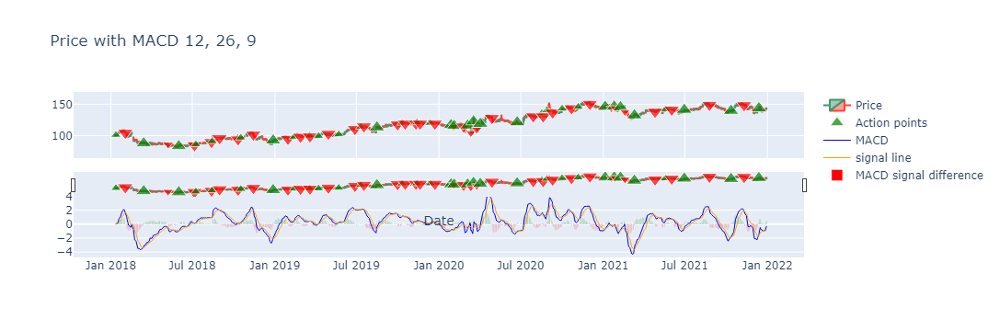

In [19]:
macd = MACD()
macd.calculate(stock_data["WMT"][-1000:])
macd.find_trade_points()
macd.plot()

Стратегия Схождение

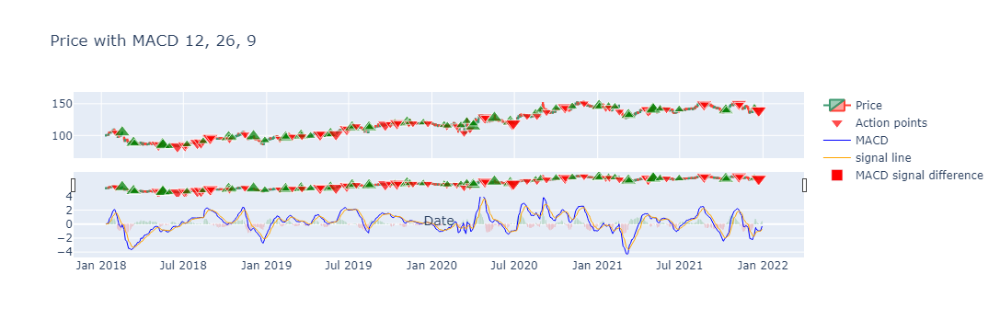

In [20]:
macd.set_trade_strategy(MACDTradeStrategy.CONVERGENCE)
macd.calculate()
macd.find_trade_points()
macd.plot()

### SuperTrend

https://www.gurutrade.ru/blogs/triendovyi-indikator-supertrend-prostota-i-nadiozhnost/

#### Описание алгоритма выбора рекомендации

Алгоритм рекомендаций по SuperTrend устроен максимально просто:
* Когда цвет индикатора меняется с красного на зеленый -> ACTIVELY_BUY
* Когда цвет индикатора меняется с зеленого на красный -> ACTIVELY_SELL

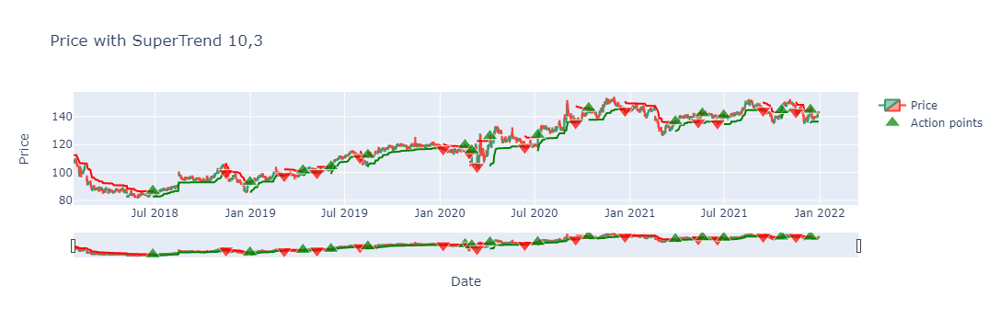

In [21]:
super_trend = SuperTrend()
super_trend.calculate(stock_data["WMT"][-1000:])
super_trend.find_trade_points()
super_trend.plot()

### CCI

https://ru.wikipedia.org/wiki/%D0%98%D0%BD%D0%B4%D0%B5%D0%BA%D1%81_%D1%82%D0%BE%D0%B2%D0%B0%D1%80%D0%BD%D0%BE%D0%B3%D0%BE_%D0%BA%D0%B0%D0%BD%D0%B0%D0%BB%D0%B0

#### Описание алгоритма выбора рекомендации

Cтратегия для CCI:
* Если значение CCI >= 200 -> ACTIVELY_SELL (зона сильной перекупленности)
* Если значение CCI <= -200 -> ACTIVELY_BUY (зона сильной перепроданности)
* Если значение CCI <= -100 -> NONE, индекс находиться в зоне перепроданности
* Если значение CCI >= 100 -> NONE, индекс находиться в зоне перекупленности
* Если значение CCI >= -100 и прошлое значение CCI было в зоне перепроданности -> BUY
* Если значение CCI <= 100 и прошлое значение CCI было в зоне перекупленности -> SELL

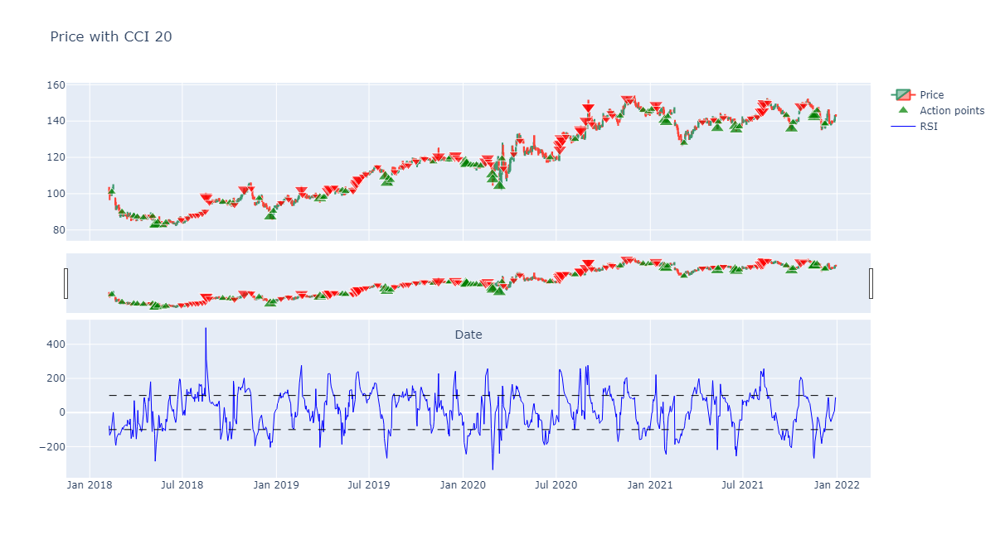

In [22]:
cci = CCI()
cci.calculate(stock_data["WMT"][-1000:])
cci.find_trade_points()
cci.plot()

### Bollinger Bands

https://ru.wikipedia.org/wiki/%D0%9B%D0%B8%D0%BD%D0%B8%D0%B8_%D0%91%D0%BE%D0%BB%D0%BB%D0%B8%D0%BD%D0%B4%D0%B6%D0%B5%D1%80%D0%B0

#### Описание алгоритма выбора рекомендации

* Если цена открытия и цена закрытия > верхней границы -> ACTIVELY_SELL
* Если цена открытия и цена закрытия < нижней границы -> ACTIVELY_BUY
* Если цена открытия >= 99.85% от верхней границы и цена закрытия > верхней границы -> SELL
* Если цена открытия <= 100.15% от нижней границы и цена закрытия < нижней границы -> BUY

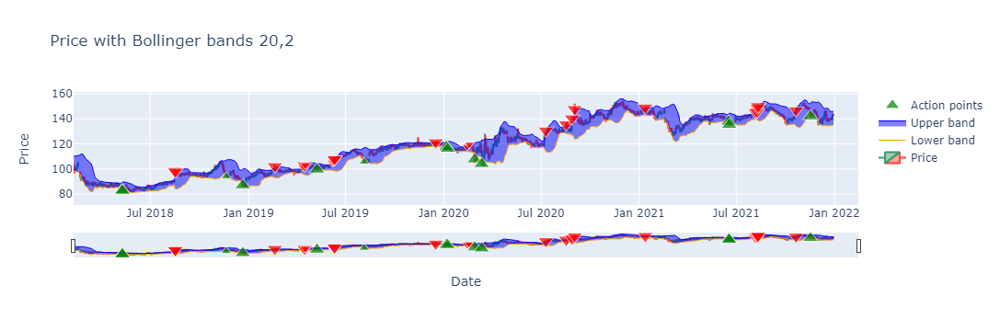

In [24]:
bollinger_bands = BollingerBands()
bollinger_bands.calculate(stock_data["WMT"][-1000:])
bollinger_bands.find_trade_points()
bollinger_bands.plot()

### MA Support Levels

Это собственный индикатор основанный на идее уровней поддержки/сопротивления от скользящих стредних - когда цена ниже скользящей средней, она выступает для цены уровнем поддержки, выше - уровнем сопротивления.

In [26]:
ma_support_levels = MASupportLevels()
ma_support_levels.calculate(stock_data["WMT"][-1000:])

* Точкой активации поддержки считается точка в которой цена открытия находится выше скользящей и цена открытия > цены закрытия и 
    (цена закрытия или нижняя цена <= 100.2% от скользящей)
* Точкой активации сопротивления считается точка в которой цена открытия находится ниже скользящей и цена открытия < цены закрытия и 
    (цена закрытия или верхняя цена >= 99.8% от скользящей)

#### Описание алгоритма выбора рекомендации

Подсчитывается количество поддержек и сопротивлений по каждой из рассматриваемых скользящих. 
* Если кол-во сопротивлений = 1 и поддержек = 0 -> SELL
* Если кол-во сопротивлений = 0 и поддержек = 1 -> BUY
* Если кол-во сопротивлений - кол-во поддержек = 2 -> SELL
* Если кол-во поддержек - кол-во сопротивлений = 2 -> BUY
* Если кол-во сопротивлений - кол-во поддержек >= 2 -> ACTIVELY_SELL
* Если кол-во поддержек - кол-во сопротивлений >= 2 -> ACTIVELY_BUY

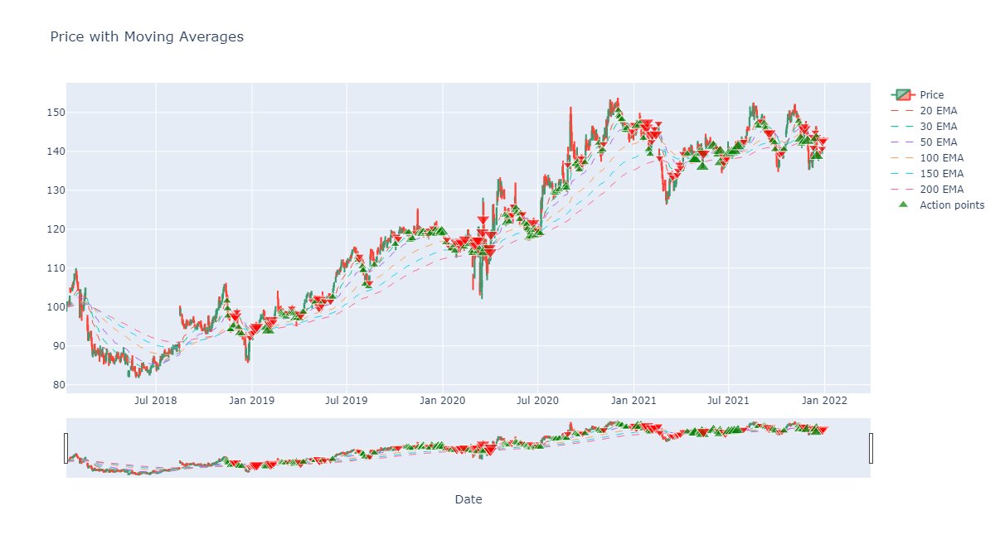

In [27]:
ma_support_levels.find_trade_points()
ma_support_levels.plot()

Для получения более надежных рекомендаций следует использовать проверенные скользящие. Проверенной скользящей считается скользящая у которой процент отскоков от неё после срабатывания поддержки/сопротивления >= 50%

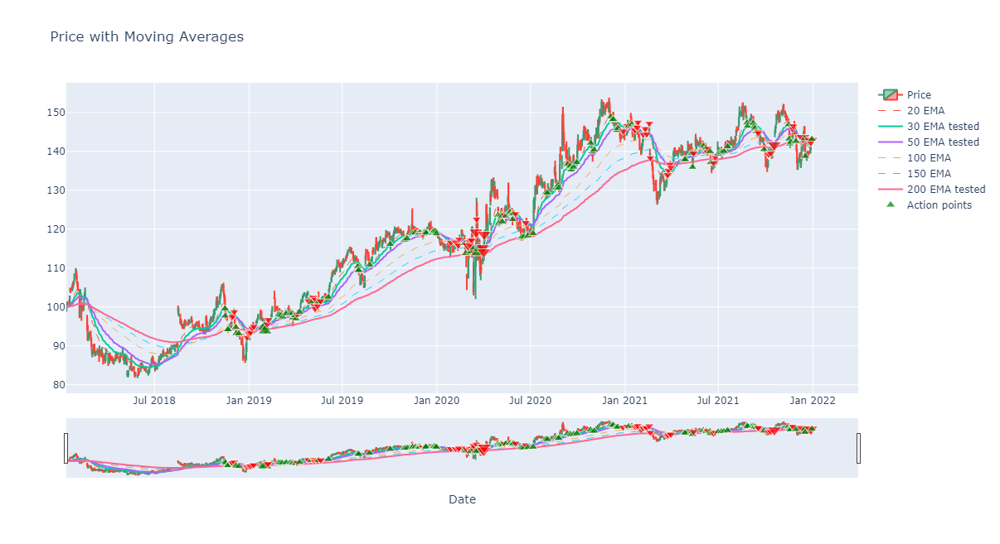

In [28]:
ma_support_levels.set_tested_MAs_usage(True)
ma_support_levels.calculate()
ma_support_levels.test_MAs_for_data(3)
ma_support_levels.find_trade_points()
ma_support_levels.plot()

## Торговый алгоритм

Основной алгоритм торговли реализуется через торгового менеджера. Торговый менеджер отвечает за управление денежными средствами. Обрабатывает поступающие новые данные по отслеживаемым акциям и на их основе принимает решения по управлению портфелем, открытием и закрытием торговых позиций. 

In [6]:
from trading.trade_manager import TradeManager

In [8]:
macd_trade_manager = TradeManager()

### Подготовка менеджера перед торговлей

Перед началом торговли идет этап подготовки. Для торгового менеджера устанавливаются отслеживаемые акции, исторические данные по этип акциям, торговые стратегии для них и сетки гиперпараметров для стратегий.

In [7]:
from datetime import datetime
test_start_date = "2020-01-01"
test_start_date_ts = pd.Timestamp(ts_input=test_start_date)
start_test = datetime.strptime(test_start_date, "%Y-%m-%d")
end_test = datetime.strptime(end_date, "%Y-%m-%d")
dates_test = pd.date_range(start_test, end_test)

Торговая стратегия - алгоритм который получая на вход дневные торговые данные акции возвращает один из 5 возможных торговых действий (TradeAction). 
Всего рассматривается 10 стратегий торговли по индикаторам: 6 стратегий торговли по одному индикатору, комбинированная стратегия MACD+SuperTrend,
голосование индикаторов, решающее дерево по рекомендациям индикаторов и случайный лес на значениях индикаторов.

In [8]:
from trading.trade_algorithms.one_indicator_trade_algorithms.rsi_trade_algorithm import RSITradeAlgorithm
from trading.trade_algorithms.one_indicator_trade_algorithms.macd_trade_algorithm import MACDTradeAlgorithm
from trading.trade_algorithms.one_indicator_trade_algorithms.super_trend_trade_algorithm import SuperTrendTradeAlgorithm
from trading.trade_algorithms.one_indicator_trade_algorithms.cci_trade_algorithm import CCITrradeAlgorithm
from trading.trade_algorithms.one_indicator_trade_algorithms.bollinger_bands_trade_algorithm import BollingerBandsTradeAlgorithm
from trading.trade_algorithms.one_indicator_trade_algorithms.ma_support_levels_trade_algorithm import MASupportLevelsTradeAlgorithm
from trading.trade_algorithms.indicators_summary_trade_algorithms.macd_super_trend_trade_algorithm import MACDSuperTrendTradeAlgorithm, MACDTradeStrategy
from trading.trade_algorithms.indicators_summary_trade_algorithms.indicators_voting_trade_algorithm import IndicatorsVotingTradeAlgorithm
from trading.trade_algorithms.indicators_summary_trade_algorithms.decision_tree_trade_algorithm import DecisionTreeTradeAlgorithm
from trading.trade_algorithms.indicators_summary_trade_algorithms.random_forest_trade_algorithm import RandomForestTradeAlgorithm

Торговая стратегия специфицируется набором гиперпараметров. Сетка гиперпараметров - множество таких наборов, из которого на этапе обучения будет выбран наиболее оптимальный набор гиперпараметров. У каждой стратегии есть метод для создания набора гиперпараметров create_hyperparameters_dict(). Если сетка наборов гиперпараметров не передаётся, то применяется сетка гиперпараметров по умолчанию.

In [35]:
MACDTradeAlgorithm.create_hyperparameters_dict()

{<MACDHyperparam.SHORT_PERIOD: 1>: 12,
 <MACDHyperparam.LONG_PERIOD: 2>: 26,
 <MACDHyperparam.SIGNAL_PERIOD: 3>: 9,
 <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>}

In [36]:
MACDTradeAlgorithm.get_default_hyperparameters_grid()

[{<MACDHyperparam.SHORT_PERIOD: 1>: 8,
  <MACDHyperparam.LONG_PERIOD: 2>: 16,
  <MACDHyperparam.SIGNAL_PERIOD: 3>: 8,
  <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>},
 {<MACDHyperparam.SHORT_PERIOD: 1>: 10,
  <MACDHyperparam.LONG_PERIOD: 2>: 20,
  <MACDHyperparam.SIGNAL_PERIOD: 3>: 9,
  <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>},
 {<MACDHyperparam.SHORT_PERIOD: 1>: 12,
  <MACDHyperparam.LONG_PERIOD: 2>: 26,
  <MACDHyperparam.SIGNAL_PERIOD: 3>: 9,
  <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>},
 {<MACDHyperparam.SHORT_PERIOD: 1>: 9,
  <MACDHyperparam.LONG_PERIOD: 2>: 18,
  <MACDHyperparam.SIGNAL_PERIOD: 3>: 8,
  <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CONVERGENCE: 2>},
 {<MACDHyperparam.SHORT_PERIOD: 1>: 10,
  <MACDHyperparam.LONG_PERIOD: 2>: 22,
  <MACDHyperparam.SIGNAL_PERIOD: 3>: 9,
  <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CONVERGENCE: 2>},
 {<MACDHyperparam.SHORT_PERIOD: 1>:

In [11]:
for stock, data in stock_data.items():
    macd_trade_manager.set_tracked_stock(stock, data[:test_start_date_ts], MACDTradeAlgorithm())

### Обработка данных нового дня

для обработки данных нового дня используется метод evaluate_new_point(self, stock_name, new_point, date), где stock_name - акция по которой передаются данные нового дня, new_point - торговые данные по новому дню, date - дата нового дня.

1. При обработке данных нового дня менеджером полученные данные передаются в алгоритм торговой стратегии, который возвращает торговое действие.
2. Расчитывается актуальный ATR.
3. Проводится обработка текущих открытых позиций в портфолио с учетом данных нового дня и торгового действия.  
4. Определяется, отсутсвуют ли текущие открытые позиции того же типа что и тип торгового действия. Если такие позиции есть, то определяется кол-во дней, прошедших с момента их открытия. Если прошло дней меньше чем минимальное количество дней бездействия, то новая позиция не открывается.
5. Расчитывается кол-во акций для покупки.
6. Если кол-во акций для покупки > 0, то открывается позиция соответсвующая торговому действию на расчитанное кол-во акций по цене закрытия.

Типы торговых позиций: LONG (BUY, ACTIVELY_BUY) , SHORT (SELL, ACTIVELY_SELL)

### Контроль финансов и расчёт кол-ва акций для покупки

Всего рассматривается 3 параметра, характеризующих финансовое состояние менеджера:
1. Стартовый капитал
2. Текущий капитал = Стартовый капитал + прибыль - убыток
3. Доступные средства - средства доступные для открытия новых позиций

Количество акций для открытия новой позиции определяется исходя из цены акции и доступных средств. Но не более установленной доли риска от текущего капитала. Соответственно, если доступных средств не хватает даже на покупку 1 акции, то открытие новой позиции будет невозможно. 

При открытии позиции величина доступных средств уменьшается на значение величины сделки (цена акции в момент открытия позиции * кол-во акций в позиции). При закрытии позиции величина доступных средств увеличивается на значение величины сделки (цена акции в момент закрытия позиции * кол-во акций в позиции). Производится расчёт прибыли/убытка и на соответсвующее значение изменяется величина текущего капитала.

### Обработка текущих открытых позиций в портфолио

На вход принимает название рассматриваемой акции, данные нового дня и расчитанное торговое действие.
Происходит итерация по всем открытым позициям по данной акции.
Позиция закрывается если выполнено одно из условий:
1. Достигнут уровень take profit или stop loss
2. Количество дней с момента открытия позиции превышает максимальный срок держания позиции
3. Новое расчитанное действие идет в противоположном направлении (Прим. была открыта позиция LONG, новое действие SELL, то есть SHORT и наоборот)
- Если был достигнут stop loss, то в статистику записывается что данная позиция была неудачной (LOSE)
- Если был достигнут take profit, то в статистику записывается что данная позиция была удачной (WIN). Происходит пролонгация позиции, если новое действие не идет в противоположном направлении.
- Если позиция закрывается и ни stop loss, ни take profit не были достигнуты, то в статистику записывается что данная позиция была нейтральной (DRAW)

### Открытие новой позиции и риск менеджмент

На вход принимает кол-во акций на позицию, данные нового дня (включают цену открытия позиции = цене закрытия), расчитанное действие, значение ATR.
Происходит расчёт уровней take profit и stop loss для новой позиции.

Уровни take profit и stop loss расчитываются исходя из параметров: множитель take profit, множитель активного действия. 
А также из того, что используется в базе расчёта: процент риска на позицию или ATR. +/- (зависит от типа действия)
* Если используется ATR: 
    - take profit = цена +/- ATR * множитель take profit * множитель активного действия
    - stop loss = цена -/+ ATR 
* Если используется процент риска на позицию:
    - take profit = цена * (1 +/- процент риска на позицию * множитель take profit * множитель активного действия)
    - stop loss = цена * (1 -/+ процент риска на позицию)

Все данные по новой открытой позиции сохраняются в портфолио.

### Пролонгация позиции

Пролонгация позиции означает, что в текущий день старая позиция закрывается, и сразу после закрытия открывается новая позиция по текущей цене,
но кол-во акций в новооткрываемой позиции уменьшается в соотвествии с параметром доли удерживаемых акций. Единственное отличие в открытии позиции по пролонгации от обычного открытия новой позиции в том, что уровень stop loss устанавливается на значении среднего между текущей ценой и ценой открытия пролонгируемой позиции.

### Установка параметров менеджера

Все используемые переменные параметры менеджера могут быть установлены как при создании менеджера так и через вызов специализированного метода set_manager_params. Если параметры не будут установлены пользователем, то они будут иметь значения по умолчанию.

In [12]:
macd_trade_manager.set_manager_params(days_to_keep_limit=10, days_to_chill=5, use_limited_money=True, start_capital=200000, equity_risk_rate=0.04)

### Обучение

Главный этап подготовки менеджера к торговле. На данном этапе по каждой акции и соответсвующей ей торговой стратегии проводиться перебор по сетке гиперпараметров:
* Для текущего набора параметров проводиться обучение стратегии на обучающей части исторических данных.
* После проводиться имитация торговли на тестовой части исторических данных.
Определяется набор гиперпараметров при котором была достигнута максимальная доходность  и проводиться обучение стратегии с данным набором на полных данных. Разделение на обучающую и тестовую часть задаётся передаваемым в метод параметром test_start_date.

In [9]:
back_test_start_date = "2018-01-01"

In [14]:
macd_train_result = macd_trade_manager.train(back_test_start_date)
macd_trade_manager.get_chosen_params()

[('WMT',
  {<MACDHyperparam.SHORT_PERIOD: 1>: 12,
   <MACDHyperparam.LONG_PERIOD: 2>: 26,
   <MACDHyperparam.SIGNAL_PERIOD: 3>: 9,
   <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>}),
 ('AAPL',
  {<MACDHyperparam.SHORT_PERIOD: 1>: 10,
   <MACDHyperparam.LONG_PERIOD: 2>: 22,
   <MACDHyperparam.SIGNAL_PERIOD: 3>: 9,
   <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CONVERGENCE: 2>}),
 ('JPM',
  {<MACDHyperparam.SHORT_PERIOD: 1>: 8,
   <MACDHyperparam.LONG_PERIOD: 2>: 16,
   <MACDHyperparam.SIGNAL_PERIOD: 3>: 8,
   <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>})]

In [15]:
macd_trade_manager.get_train_results("WMT")

[('{<MACDHyperparam.SHORT_PERIOD: 1>: 8, <MACDHyperparam.LONG_PERIOD: 2>: 16, <MACDHyperparam.SIGNAL_PERIOD: 3>: 8, <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>}',
              EARNED_PROFIT  WINS  LOSES  DRAWS
  STOCK_NAME                                   
  JPM              0.000000   0.0    0.0    0.0
  AAPL             0.000000   0.0    0.0    0.0
  WMT           -731.730942   1.0   25.0   28.0
  TOTAL         -731.730942   1.0   25.0   28.0),
 ('{<MACDHyperparam.SHORT_PERIOD: 1>: 10, <MACDHyperparam.LONG_PERIOD: 2>: 20, <MACDHyperparam.SIGNAL_PERIOD: 3>: 9, <MACDHyperparam.TRADE_STRATEGY: 4>: <MACDTradeStrategy.CLASSIC: (1,)>}',
              EARNED_PROFIT  WINS  LOSES  DRAWS
  STOCK_NAME                                   
  JPM              0.000000   0.0    0.0    0.0
  AAPL             0.000000   0.0    0.0    0.0
  WMT            812.948082   3.0   23.0   27.0
  TOTAL          812.948082   3.0   23.0   27.0),
 ('{<MACDHyperparam.SHORT_PERIOD: 1>: 12,

### Процесс торговли

после того как торговый менеджер был подготовлен, имитируется процесс поступления новых дневных данных по отслеживаемым акциям. На их основе менеджер принимает торговые решения.

In [16]:
for date in dates_test:
    for stock, data in stock_data.items():
        if date in data[start_test:].index:
            new_point = data.loc[date]
            macd_trade_manager.evaluate_new_point(stock, new_point, date)

Not enough money to purchase JPM at 2021-10-12 00:00:00 by price 165.36000061035156
Not enough money to purchase AAPL at 2021-11-10 00:00:00 by price 147.9199981689453
Not enough money to purchase AAPL at 2021-11-17 00:00:00 by price 153.49000549316406
Not enough money to purchase WMT at 2021-12-13 00:00:00 by price 143.57000732421875
Not enough money to purchase AAPL at 2021-12-17 00:00:00 by price 171.13999938964844
Not enough money to purchase AAPL at 2021-12-28 00:00:00 by price 179.2899932861328


In [17]:
macd_trade_manager.get_equity_info()

{'start capital': 200000,
 'account money': 197759.4997291565,
 'available money': 88.61948013305664}

## Торговые стратегии

В начале рассмотрим стратегии, основанные на одном единственном индикаторе и принимающие торговые решения на основе рекомендаций выдаваемых этим индикатором.

In [15]:
one_idicator_strategies = {
    "RSI": RSITradeAlgorithm,
    "MACD": MACDTradeAlgorithm,
    "CCI": CCITrradeAlgorithm,
    "Bollinger Bands": BollingerBandsTradeAlgorithm,
    "SuperTrend": SuperTrendTradeAlgorithm,
    "MA Support Levels": MASupportLevelsTradeAlgorithm}

In [21]:
trade_managers = {}
for indicator, strategy_alg in one_idicator_strategies.items():
    trade_manager = TradeManager()
    trade_managers[indicator] = trade_manager
    trade_manager.set_manager_params(days_to_keep_limit=10, days_to_chill=5,
                                     use_limited_money=True, start_capital=200000,
                                     equity_risk_rate=0.04, use_atr=True, active_action_multiplier=1.25)
    for stock, data in stock_data.items():
        trade_manager.set_tracked_stock(stock, data[:test_start_date_ts], strategy_alg())
    trade_manager.train(back_test_start_date)
    for date in dates_test:
        for stock, data in stock_data.items():
            if date in data[start_test:].index:
                new_point = data.loc[date]
                trade_manager.evaluate_new_point(stock, new_point, date)

### RSI

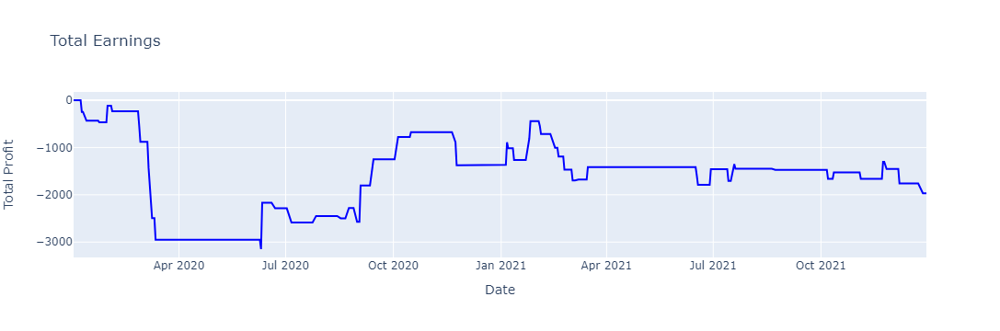

In [22]:
trade_managers["RSI"].plot_earnings_curve()

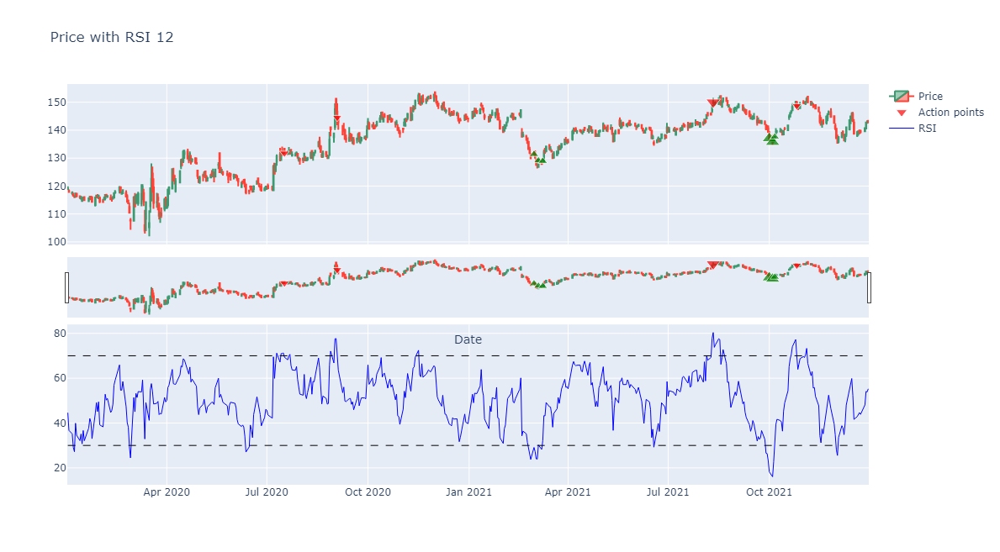

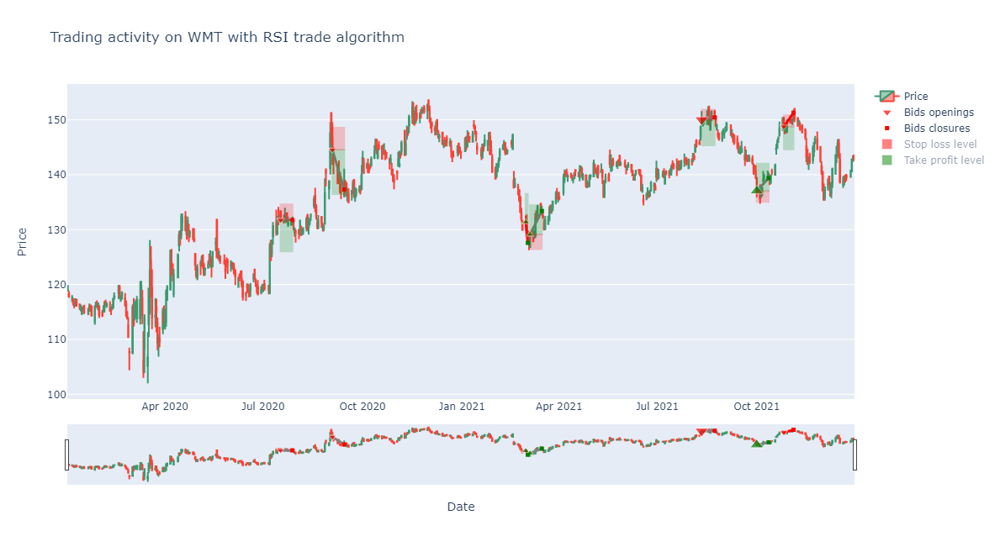

In [23]:
trade_managers["RSI"].plot_stock_history("WMT", plot_algorithm_graph=True)

### MACD

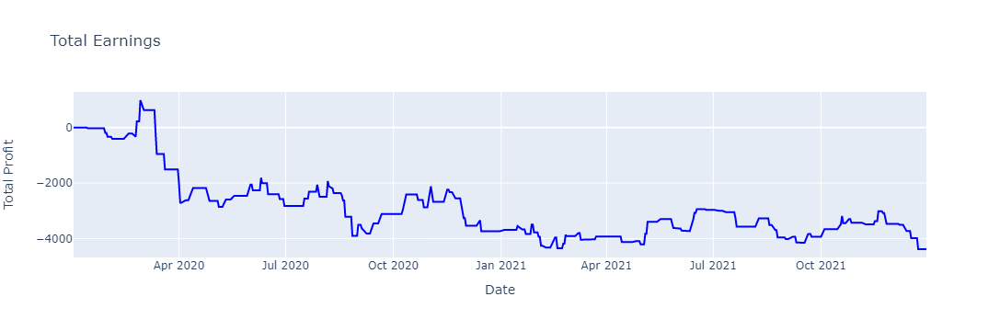

In [24]:
trade_managers["MACD"].plot_earnings_curve()

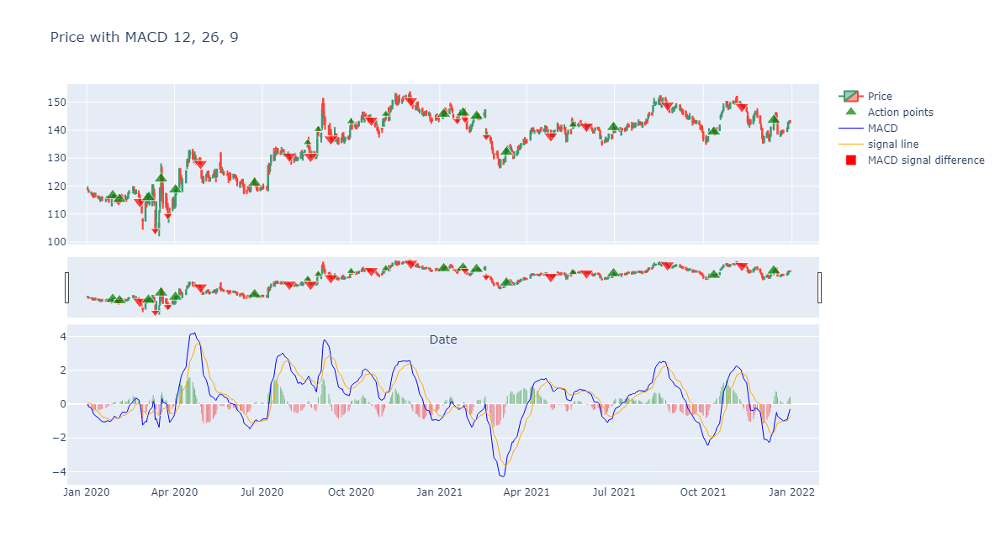

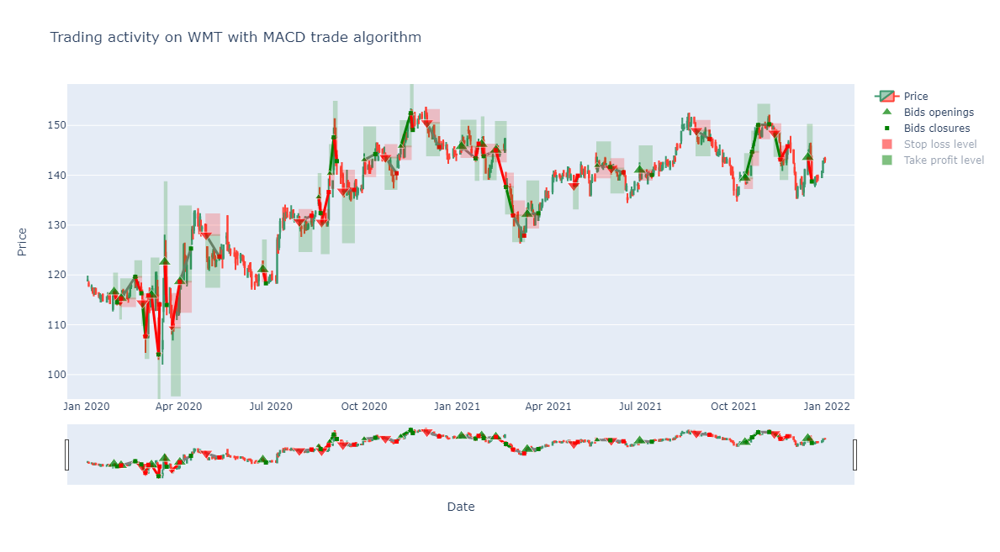

In [25]:
trade_managers["MACD"].plot_stock_history("WMT", plot_algorithm_graph=True)

### SuperTrend

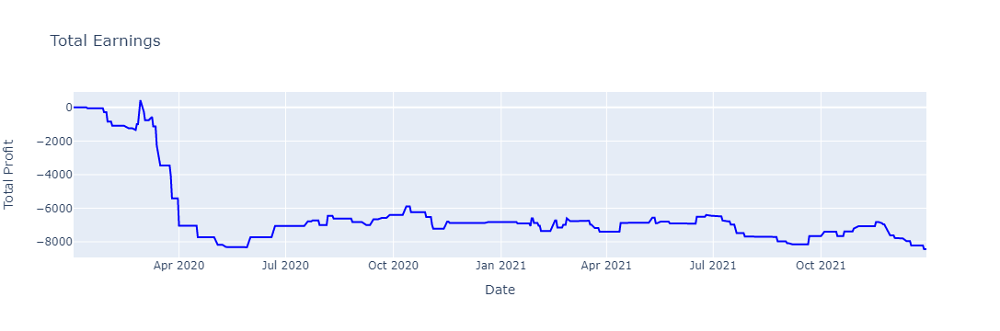

In [26]:
trade_managers["SuperTrend"].plot_earnings_curve()

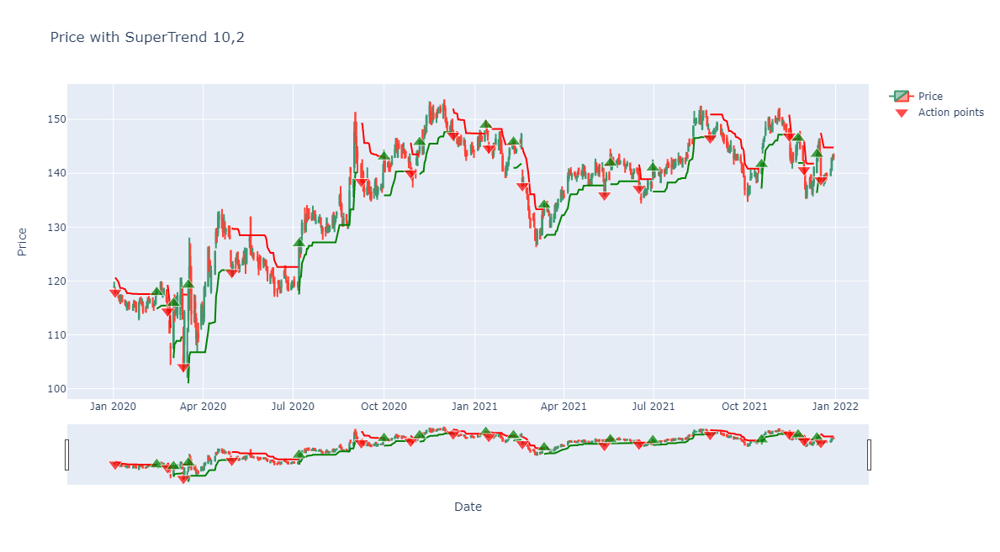

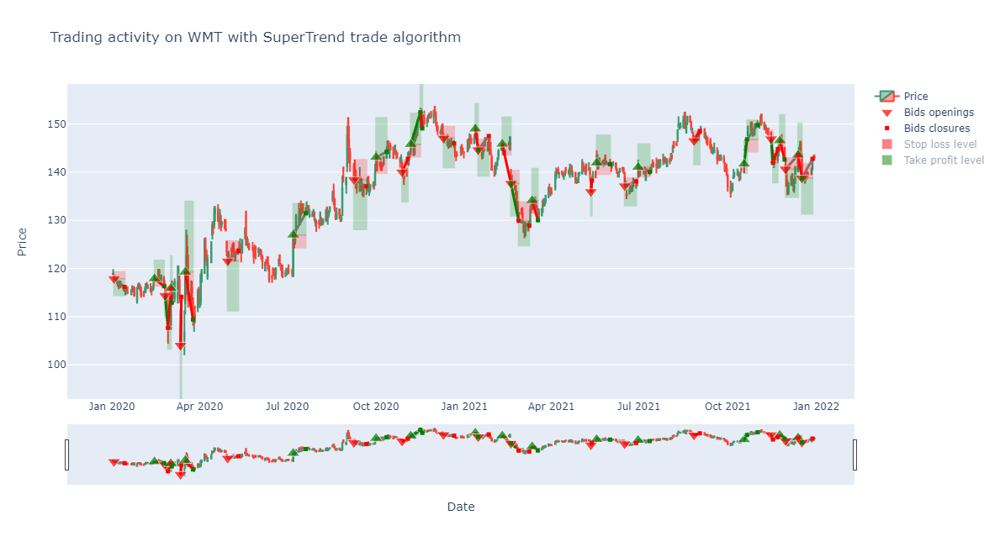

In [27]:
trade_managers["SuperTrend"].plot_stock_history("WMT", plot_algorithm_graph=True)

### CCI

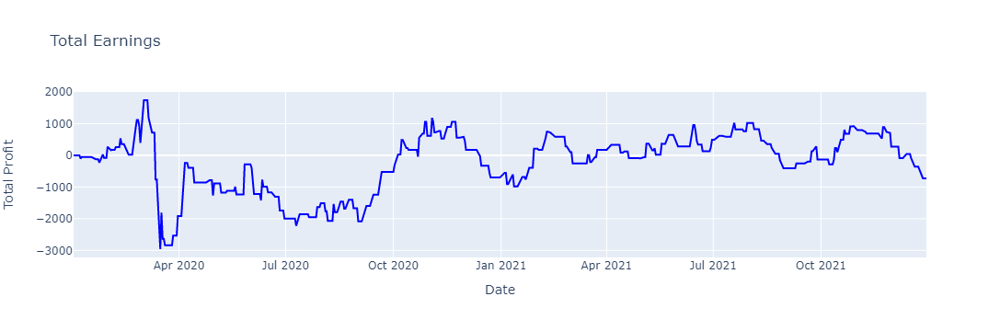

In [28]:
trade_managers["CCI"].plot_earnings_curve()

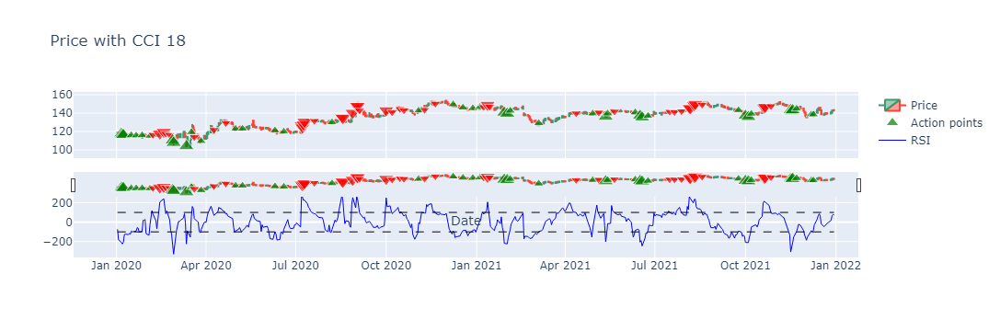

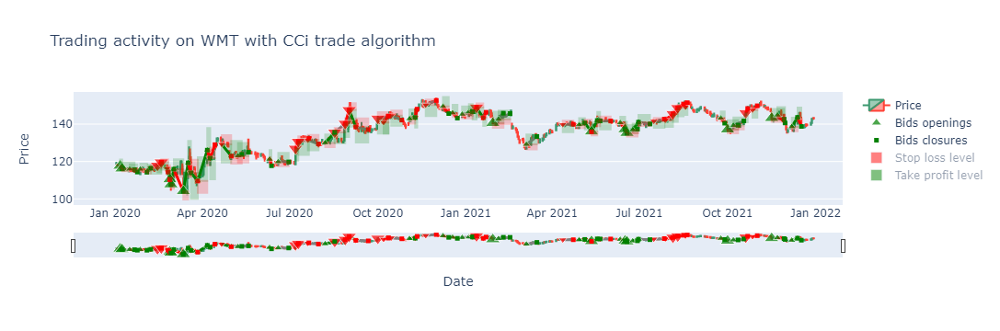

In [29]:
trade_managers["CCI"].plot_stock_history("WMT", plot_algorithm_graph=True)

### Bollinger Bands

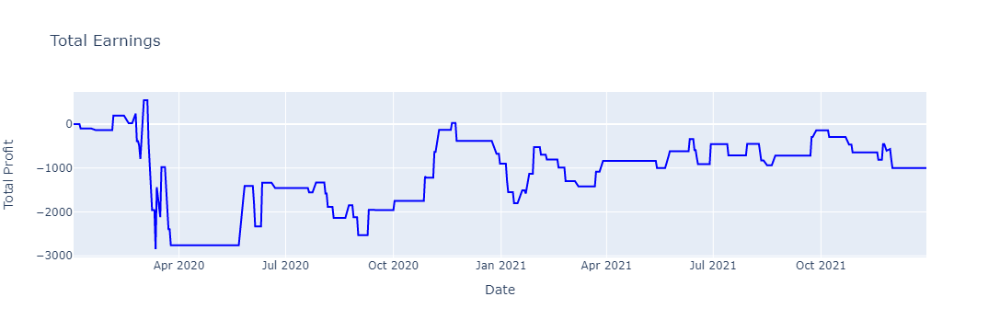

In [30]:
trade_managers["Bollinger Bands"].plot_earnings_curve()

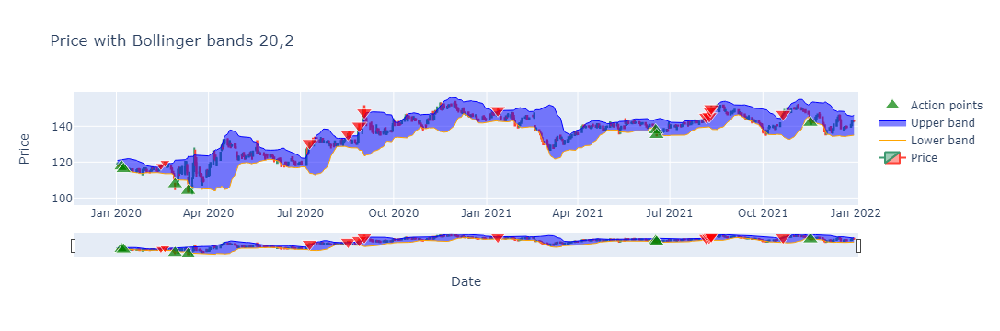

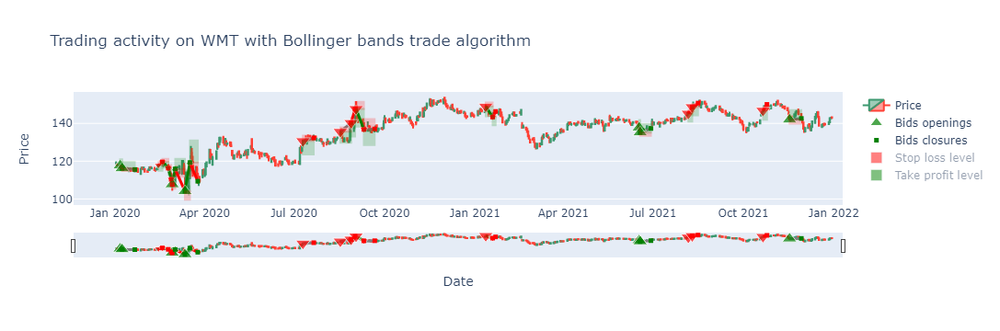

In [31]:
trade_managers["Bollinger Bands"].plot_stock_history("WMT", plot_algorithm_graph=True)

### MA Support Levels

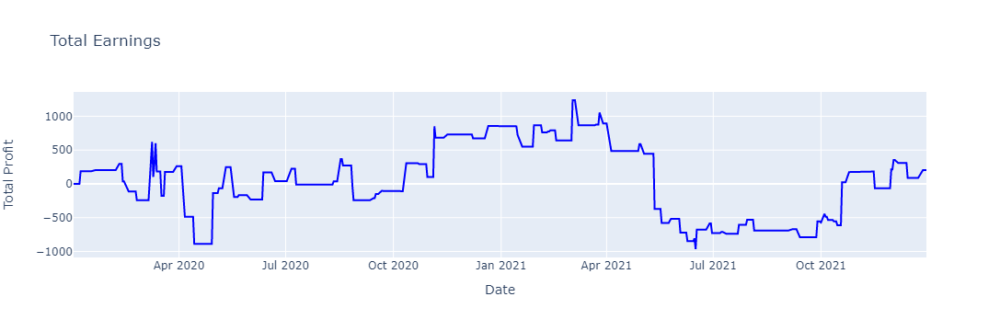

In [32]:
trade_managers["MA Support Levels"].plot_earnings_curve()

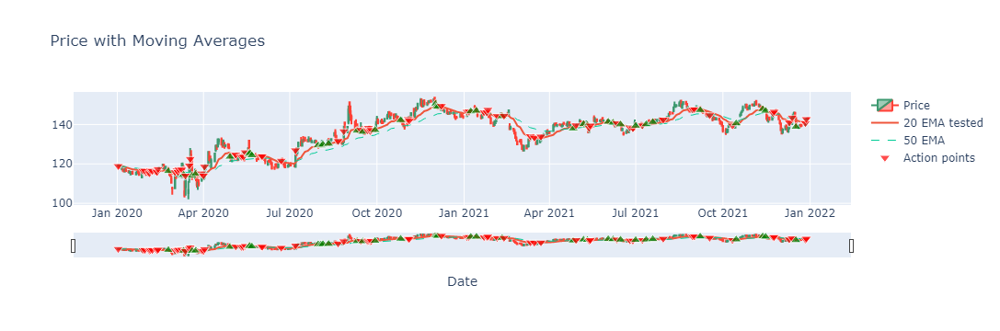

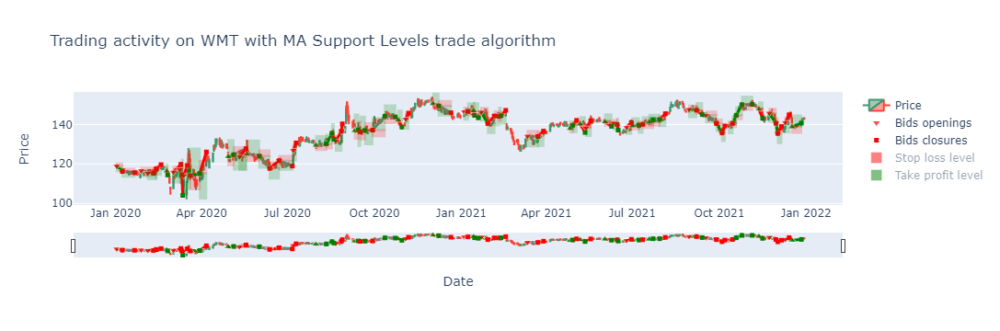

In [33]:
trade_managers["MA Support Levels"].plot_stock_history("WMT", plot_algorithm_graph=True)

## MACD + SuperTrend

Главный недостаток индикатора MACD это возможные частые ложные срабатывания. SuperTrend же напротив хорошо улавливает глобальный ценовой тренд, но дает слишком мало торговых рекомендаций. Суть стратегии MACD+SuperTrend в объединение данных от данных двух индикаторов с целью преодоления их недостатков.

### Описание алгоритма принятия торгового решения

В рамках данной стратегии опроным сигналом являются сигналы-рекомендации индикатора MACD. Возможны два режима работы данной стратегии: строгий MACD и не строгий MACD. В строгом варианте рассматриваются только сигналы типа ACTIVELY_BUY или ACTIVELY_SELL. Когда MACD сообщает рекомендацию к принятию торгового действия происходит проверка на совпадение типа рекомендуемого действия и текущим направлением тренда определяемым по SuperTrend. Если они совпадают, то алгоритм принимает соответсвующее торговое решение, если не совпадают, то алгоритм будет ожидать изменения направления тренда SuperTrend в течении следующих нескольких дней, число которых определяется параметром дней ожидания изменения SuperTrend.

In [37]:
macd_super_trend_trade_manager = TradeManager()
macd_super_trend_trade_manager.set_manager_params(days_to_keep_limit=10, days_to_chill=5,
                                     use_limited_money=True, start_capital=200000,
                                     equity_risk_rate=0.04, use_atr=True, active_action_multiplier=1.25)
for stock, data in stock_data.items():
    macd_super_trend_trade_manager.set_tracked_stock(stock, data[:test_start_date_ts], MACDSuperTrendTradeAlgorithm())
macd_super_trend_trade_manager.train(back_test_start_date)
for date in dates_test:
    for stock, data in stock_data.items():
        if date in data[start_test:].index:
            new_point = data.loc[date]
            macd_super_trend_trade_manager.evaluate_new_point(stock, new_point, date)    

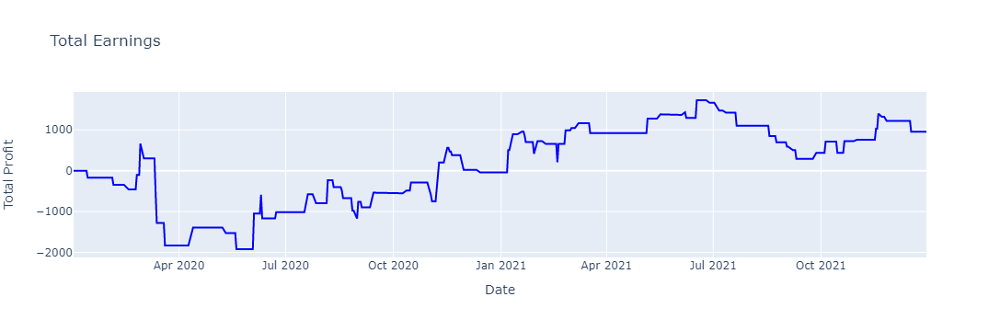

In [38]:
macd_super_trend_trade_manager.plot_earnings_curve()

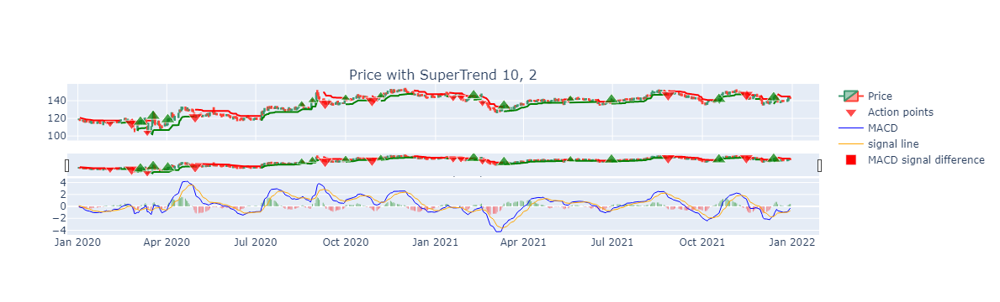

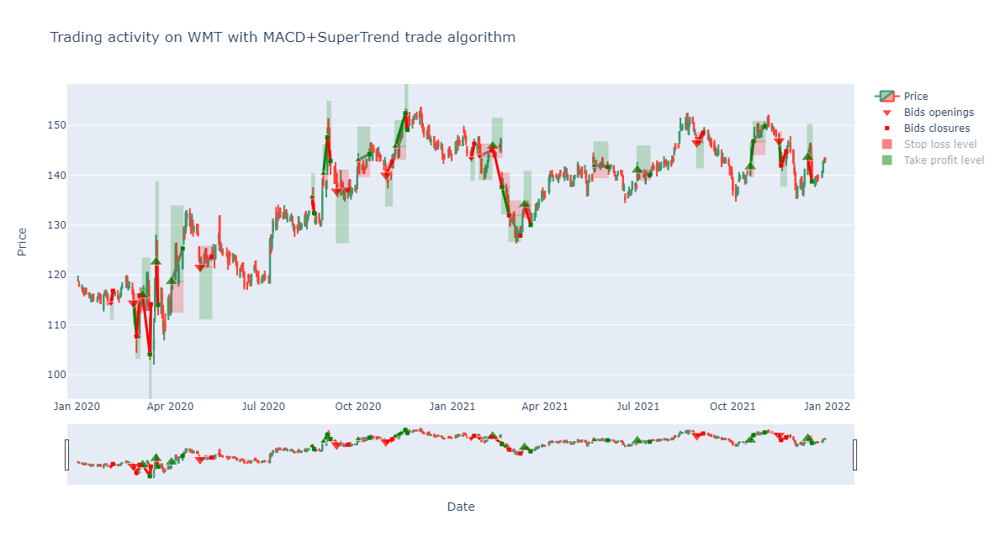

In [39]:
macd_super_trend_trade_manager.plot_stock_history("WMT", plot_algorithm_graph=True)

## Стратегия голосования индикаторов

Суть данной стратегии заключается в идее использовать сразу все доступные индикаторы и принимать как итоговое некоторое консенсусное решение. Для выработки консенсусного решения используется механизм голосования.

### Описание алгоритма принятия торгового решения

Агрегируются торговые рекомендации от всех индикаторов. Набор рекомендаций от всех индикаторов образует результат текущего голосования. Так как зачастую рекомендацией индикатора является бездействие (NONE), то для лучшей репрезентации общего направления индикаторов формируется результат сумарного голосования.

В результате сумарного голосования учитываются результаты текущего голосования и результаты предыдущих голосований за период определяемым параметром периода суммарного голосования. За рекомендацию индикатора в сумарном голосовании считается не NONE рекомендация в прошлом голосовании, при этом рекомендации из голосования более близкого к текущему имеют более высокий приоритет (наибольший приоритет у рекомендации из текущего голосования если она не NONE).

По результату суммарного голосования происходит подсчёт итогового результата. Чтобы решение на покупку или продажу было принято, необходимо чтобы доля голосов за соответствующее действие в голосовании была не менее проходного барьера.
* Если голосов за покупку больше чем голосов за продажу - определяем каких голосов за покупку больше: BUY или ACTIVELY_BUY, принимаем соответствующее торговое решение. В случае равенства BUY и ACTIVELY_BUY принимается решение BUY.
* Если голосов за продажу больше чем голосов за покупку - определяем каких голосов за продажу больше: SELL или ACTIVELY_SELL, принимаем соответствующее торговое решение. В случае равенства SELL и ACTIVELY_SELL принимается решение SELL.

In [40]:
idicators_voting_trade_manager = TradeManager()
idicators_voting_trade_manager.set_manager_params(days_to_keep_limit=10, days_to_chill=5,
                                     use_limited_money=True, start_capital=200000,
                                     equity_risk_rate=0.04, use_atr=True, active_action_multiplier=1.25)
for stock, data in stock_data.items():
    idicators_voting_trade_manager.set_tracked_stock(stock, data[:test_start_date_ts], IndicatorsVotingTradeAlgorithm())
idicators_voting_trade_manager.train(back_test_start_date)
for date in dates_test:
    for stock, data in stock_data.items():
        if date in data[start_test:].index:
            new_point = data.loc[date]
            idicators_voting_trade_manager.evaluate_new_point(stock, new_point, date)    

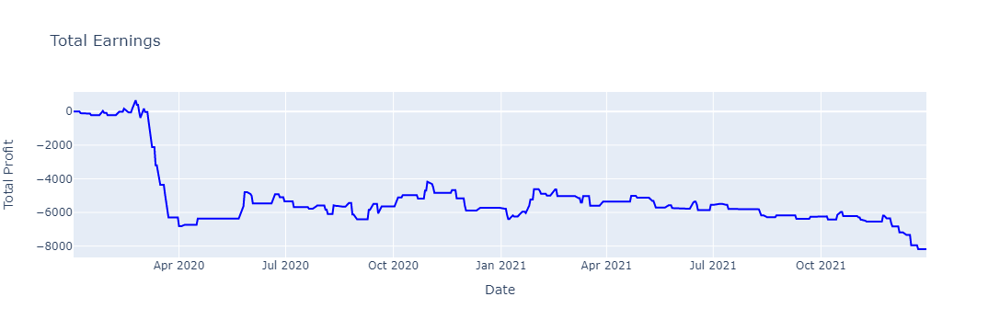

In [44]:
idicators_voting_trade_manager.plot_earnings_curve()

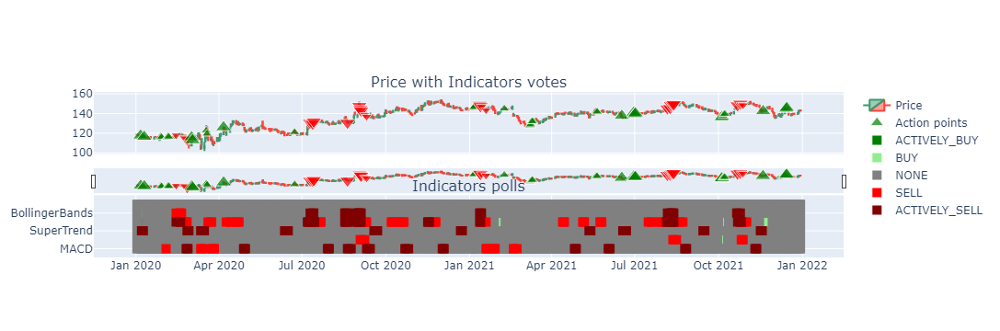

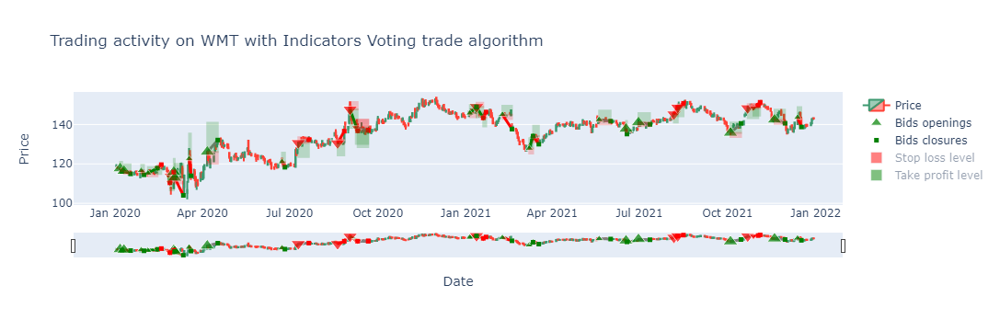

In [45]:
idicators_voting_trade_manager.plot_stock_history("WMT", plot_algorithm_graph=True)

## Стратегия Решающее дерево